# **Практическая работа №3. Основные методы OpenCV. Часть №1**

---

# **Тема №1. Чтение, запись и отображение**



## **Задание 1:**  
Напишите процедуру, которая:

- Считывает цветное изображение в режиме `cv2.IMREAD_COLOR`.
- Преобразует его в оттенки серого с использованием `cv2.cvtColor()`.
- Сохраняет полученное черно-белое изображение на диск.
- Отображает оба изображения (оригинальное цветное и преобразованное черно-белое).




In [1]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

In [465]:
url = r'https://2spalnika.ru/wp-content/uploads/2022/12/zhivotniy-mir-hibin-800x600.jpg'
!wget -O arctic_fox.jpg '{url}'
image_path = 'arctic_fox.jpg'

--2025-09-14 14:58:18--  https://2spalnika.ru/wp-content/uploads/2022/12/zhivotniy-mir-hibin-800x600.jpg
Resolving 2spalnika.ru (2spalnika.ru)... 87.236.16.233
Connecting to 2spalnika.ru (2spalnika.ru)|87.236.16.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 105772 (103K) [image/jpeg]
Saving to: ‘arctic_fox.jpg’

arctic_fox.jpg      100%[===================>] 103.29K   282KB/s    in 0.4s    

2025-09-14 14:58:19 (282 KB/s) - ‘arctic_fox.jpg’ saved [105772/105772]



In [466]:
img_color = cv.imread(image_path, cv.IMREAD_COLOR)
img_color_rgb = cv.cvtColor(img_color, cv.COLOR_RGB2BGR)

gray_img = cv.cvtColor(img_color_rgb, cv.COLOR_BGR2GRAY)
gray_img = cv.cvtColor(gray_img, cv.COLOR_GRAY2RGB)


In [99]:
cv.imwrite("arctic_fox_rgb.jpg", img_color_rgb)
cv.imwrite("arctic_fox_gray.jpg", gray_img)

True

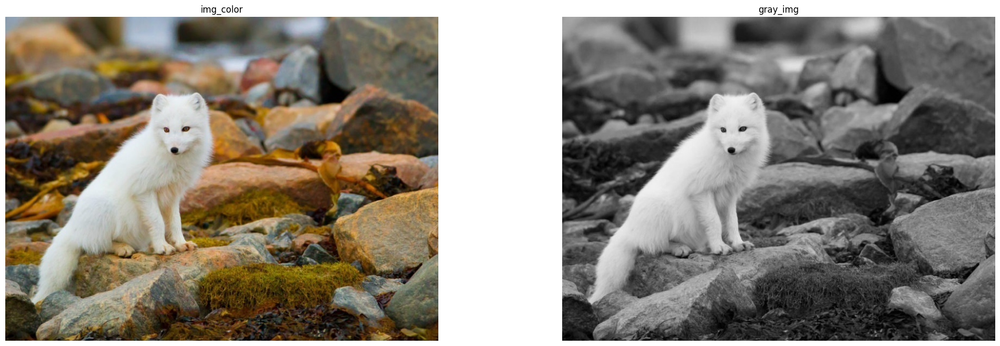

In [100]:
plt.figure(figsize=(25, 8))

plt.subplot(1, 2, 1)
plt.imshow(img_color_rgb)
plt.title("img_color")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gray_img)
plt.title("gray_img")
plt.axis('off')

plt.show()

## **Задание 2:**  
Используя режим `cv2.IMREAD_UNCHANGED`, загрузите изображение с альфа-каналом (например, PNG с прозрачностью). Затем:

- Разделите изображение на каналы (B, G, R, A).
- Создайте новое изображение, где прозрачность (альфа-канал) инвертирована (т.е. прозрачные области становятся непрозрачными и наоборот).
- Сохраните и отобразите полученное изображение.

In [162]:
import numpy as np

In [101]:
image_path = "arctic_fox_rgb.jpg"

In [165]:
url = r'https://pngfre.com/wp-content/uploads/red-fox-16-1536x1354.png'
!wget -O red_fox.png '{url}'
image_path = 'red_fox.png'

--2025-09-14 11:12:25--  https://pngfre.com/wp-content/uploads/red-fox-16-1536x1354.png
Resolving pngfre.com (pngfre.com)... 104.21.112.1, 104.21.48.1, 104.21.80.1, ...
Connecting to pngfre.com (pngfre.com)|104.21.112.1|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1669395 (1.6M) [image/png]
Saving to: ‘red_fox.png’

red_fox.png         100%[===================>]   1.59M  --.-KB/s    in 0.01s   

2025-09-14 11:12:25 (121 MB/s) - ‘red_fox.png’ saved [1669395/1669395]



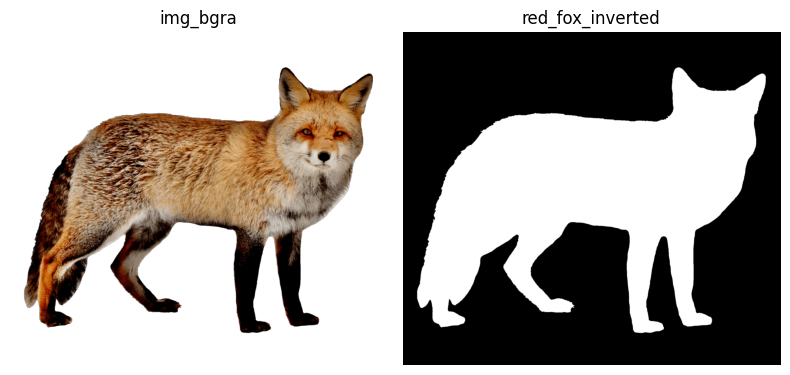

In [166]:
img_unchanged = cv.imread(image_path, cv.IMREAD_UNCHANGED)
img_bgra = cv.cvtColor(img_unchanged, cv.COLOR_BGRA2RGBA)

b, g, r, a = cv.split(img_unchanged)

plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_bgra)
plt.title('img_bgra')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(a, cmap='gray')
plt.title('red_fox_inverted')
plt.axis('off')

plt.tight_layout()
plt.show()

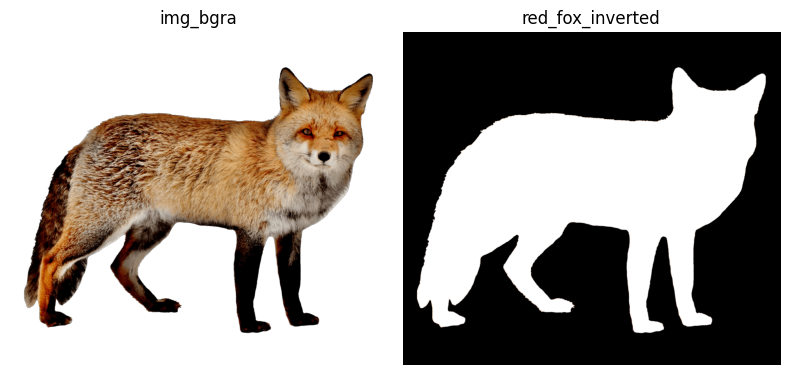

In [149]:
a_inverted = 255 - a
img_inverted_alpha = cv.merge([b, g, r, a_inverted])

output_path = 'red_fox_inverted.png'
cv.imwrite(output_path, img_inverted_alpha)

plt.figure(figsize=(8, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_bgra)
plt.title('img_bgra')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(img_inverted_alpha, cv.COLOR_BGRA2RGBA))
plt.title('red_fox_inverted')
plt.axis('off')

plt.tight_layout()
plt.show()

# **Тема №2. Работа с цветовыми палитрами**



## **Задание 3:**  
Напишите процедуру, которая:

- Считывает цветное изображение.
- Преобразует его из цветового пространства BGR в HSV с помощью `cv2.cvtColor()`.
- Увеличивает насыщенность (канал S) в 1.5 раза, не превышая максимального значения.
- Преобразует изображение обратно в цветовое пространство BGR.
- Отображает оригинальное и полученное изображения рядом для сравнения.

In [233]:
def procedure_BGR(img, satur = 1.5, max_satur = 255):
  img_hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
  h, s, v = cv.split(img_hsv)

  s = s.astype(float)
  s = np.clip(s * satur, 0, max_satur)
  s = s.astype(np.uint8)

  img_res = cv.merge([h, s, v])
  img_res = cv.cvtColor(img_res, cv.COLOR_HSV2BGR)

  plt.figure(figsize=(16,6))

  plt.subplot(1, 2, 1)
  plt.imshow(img)
  plt.title('img')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(img_res)
  plt.title('img_res')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [221]:
url = r'https://2spalnika.ru/wp-content/uploads/2022/12/zhivotniy-mir-hibin-800x600.jpg'
!wget -O arctic_fox.jpg '{url}'
image_path = 'arctic_fox.jpg'

--2025-09-14 11:38:08--  https://2spalnika.ru/wp-content/uploads/2022/12/zhivotniy-mir-hibin-800x600.jpg
Resolving 2spalnika.ru (2spalnika.ru)... 87.236.16.233
Connecting to 2spalnika.ru (2spalnika.ru)|87.236.16.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 105772 (103K) [image/jpeg]
Saving to: ‘arctic_fox.jpg’

arctic_fox.jpg      100%[===================>] 103.29K   421KB/s    in 0.2s    

2025-09-14 11:38:09 (421 KB/s) - ‘arctic_fox.jpg’ saved [105772/105772]



In [224]:
img_color = cv.imread(image_path, cv.IMREAD_COLOR)
img_color_bgr = cv.cvtColor(img_color, cv.COLOR_RGB2BGR)

img_hsv = cv.cvtColor(img_color_bgr, cv.COLOR_HSV2BGR)
h, s, v = cv.split(img_hsv)

print(h.dtype,
s.dtype,
v.dtype)

uint8 uint8 uint8


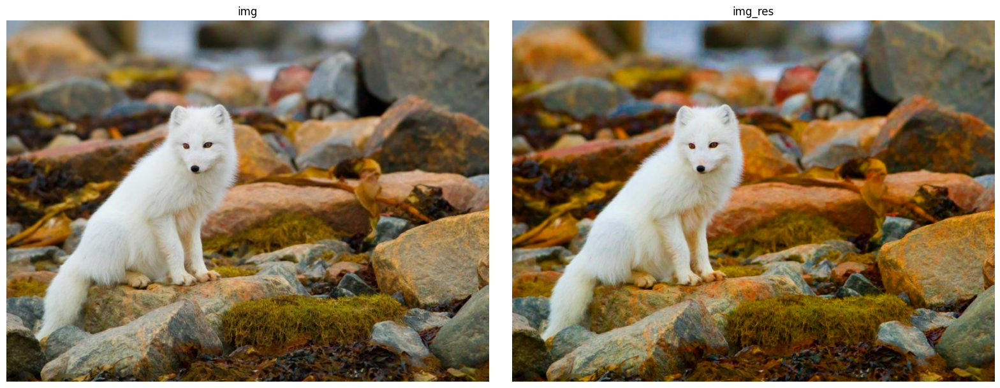

In [234]:
procedure_BGR(img_color_bgr)

## **Задание 4:**  
Напишите процедуру, которая:

- Считывает изображение и Преобразует его в цветовое пространство YCrCb.
- Применяет размытие к компоненте яркости Y (при помощи фильтра, см. материал предыдущих занятий).
- Снова Преобразует изображение в цветовое пространство BGR.
- Отображает исходное и размытое изображения.

In [229]:
kernels = {
    'Original': None,  # Исходное изображение

    'Box blur': (1/9) * np.array([[1, 1, 1],
                                  [1, 1, 1],
                                  [1, 1, 1]]),

    'Gaussian blur': (1/256) * np.array([
        [1, 4, 6, 4, 1],
        [4, 16, 24, 16, 4],
        [6, 24, 36, 24, 6],
        [4, 16, 24, 16, 4],
        [1, 4, 6, 4, 1]
    ])
}
def procedure_YCrCb(img, blur_method):
  img_yrcb = cv.cvtColor(img, cv.COLOR_BGR2YCrCb)
  y, cr, cb = cv.split(img_yrcb)
  if blur_method not in kernels:
    return "Нету такого размытия"

  y = cv.filter2D(y, -1, kernels[blur_method])
  img_res = cv.merge([y, cr, cb])
  img_res = cv.cvtColor(img_res, cv.COLOR_YCrCb2BGR)

  plt.figure(figsize=(16,6))

  plt.subplot(1, 2, 1)
  plt.imshow(img)
  plt.title('img')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(img_res)
  plt.title('img_res')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

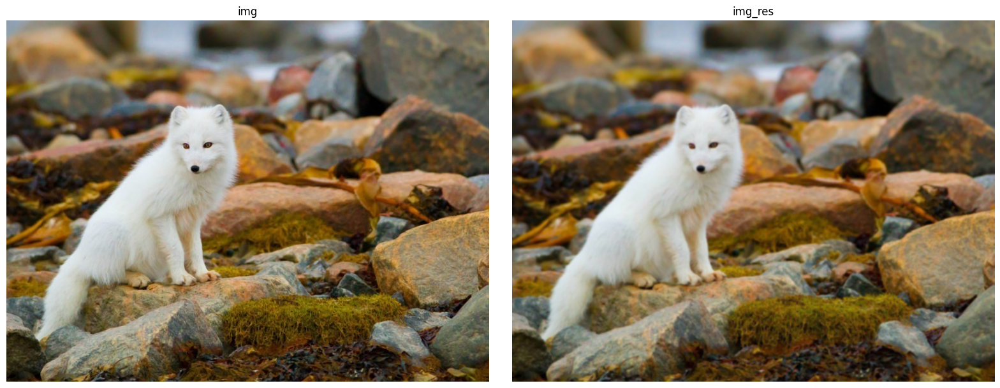

In [232]:
procedure_YCrCb(img_color_bgr, blur_method='Gaussian blur')

---

# **Тема №3. Слияние и усиление**

## **Задание 5:**  
Создайте процедуру, которая:

- Считывает два изображения одинакового размера (можно подкорректировать с помощью метода `.resize()`).
- Выполняет побитовое ИЛИ (OR) над соответствующими пикселями двух изображений.
- Сохраняет и отображает результат операции.

In [282]:
import cv2 as cv
import matplotlib.pyplot as plt

def procedure_OR(img1, img2):
    img1 = cv.resize(img1, (img2.shape[1], img2.shape[0]))

    img_or = cv.bitwise_or(img1, img2)

    plt.figure(figsize=(16, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(img1)
    plt.title('img1')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img2)
    plt.title('img2')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_or)
    plt.title('img_or')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [284]:
url1 = r'https://media.geeksforgeeks.org/wp-content/uploads/20190222191001/1bit1.png'
!wget -O img1.png '{url1}'

--2025-09-14 12:06:44--  https://media.geeksforgeeks.org/wp-content/uploads/20190222191001/1bit1.png
Resolving media.geeksforgeeks.org (media.geeksforgeeks.org)... 3.171.61.42, 3.171.61.103, 3.171.61.87, ...
Connecting to media.geeksforgeeks.org (media.geeksforgeeks.org)|3.171.61.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1122 (1.1K) [image/png]
Saving to: ‘img1.png’

img1.png            100%[===================>]   1.10K  --.-KB/s    in 0s      

2025-09-14 12:06:44 (43.0 MB/s) - ‘img1.png’ saved [1122/1122]



In [285]:
url2 = r'https://media.geeksforgeeks.org/wp-content/uploads/20190222191045/2bit2.png'
!wget -O img2.png '{url2}'

--2025-09-14 12:06:45--  https://media.geeksforgeeks.org/wp-content/uploads/20190222191045/2bit2.png
Resolving media.geeksforgeeks.org (media.geeksforgeeks.org)... 3.171.61.42, 3.171.61.103, 3.171.61.87, ...
Connecting to media.geeksforgeeks.org (media.geeksforgeeks.org)|3.171.61.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2677 (2.6K) [image/png]
Saving to: ‘img2.png’

img2.png            100%[===================>]   2.61K  --.-KB/s    in 0s      

2025-09-14 12:06:45 (732 MB/s) - ‘img2.png’ saved [2677/2677]



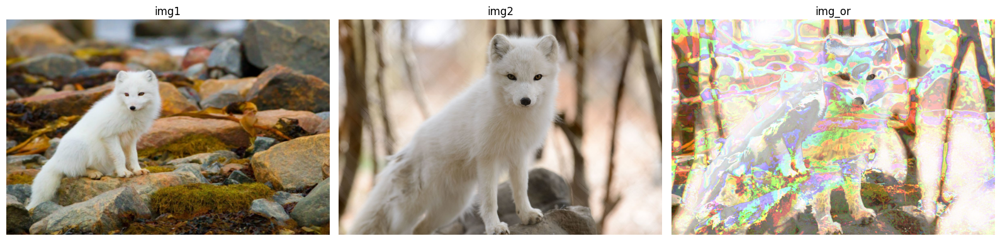

In [290]:
image_path = 'arctic_fox.jpg'
image_path2 = 'arctic_fox2.jpg'

img_color = cv.imread(image_path, cv.IMREAD_COLOR)
img_color_rgb = cv.cvtColor(img_color, cv.COLOR_RGB2BGR)

img_color2 = cv.imread(image_path2, cv.IMREAD_COLOR)
img_color_rgb2 = cv.cvtColor(img_color2, cv.COLOR_RGB2BGR)

procedure_OR(img_color_rgb, img_color_rgb2)

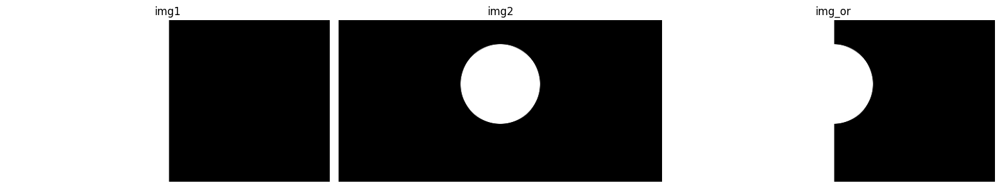

In [289]:
img1 = cv.imread('img1.png')
img2 = cv.imread('img2.png')

procedure_OR(img1, img2)

## **Задание 6:**  
Реализуйте следующий алгоритм:

- Считайте цветное изображение и разделите его на три канала с использованием `.split()`.
- Примените к каждому каналу разный коэффициент гамма-коррекции (например, для R – 0.5, G – 1.0, B – 1.5).
- Объедините каналы обратно с помощью `.merge()`.
- Отобразите исходное и обработанное изображения.


In [331]:
def adjust_gamma(channel, gamma):
    lookUpTable = np.empty((1,256), np.uint8)
    for i in range(256):
        lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
    res = cv.LUT(channel, lookUpTable)
    return res

# def adjust_gamma(channel, gamma):
#     # Создаем таблицу преобразования для гамма-коррекции
#     inv_gamma = 1.0 / gamma
#     table = np.array([(i / 255.0) ** inv_gamma * 255 for i in np.arange(256)]).astype("uint8")

#     # Применяем гамма-коррекцию с использованием таблицы
#     return cv.LUT(channel, table)

def alg(img, gamma_r = 0.5, gamma_g = 1.0, gamma_b = 1.5):
  b, g, r = cv.split(img)
  r = adjust_gamma(r, gamma_r)
  g = adjust_gamma(g, gamma_g)
  b = adjust_gamma(b, gamma_b)
  img_res = cv.merge([r, g, b])
  img_res = cv.cvtColor(img_res, cv.COLOR_RGB2BGR)

  plt.figure(figsize=(16,6))

  plt.subplot(1, 2, 1)
  plt.imshow(img)
  plt.title('img')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(img_res)
  plt.title('img_res')
  plt.axis('off')

  plt.tight_layout()
  plt.show()



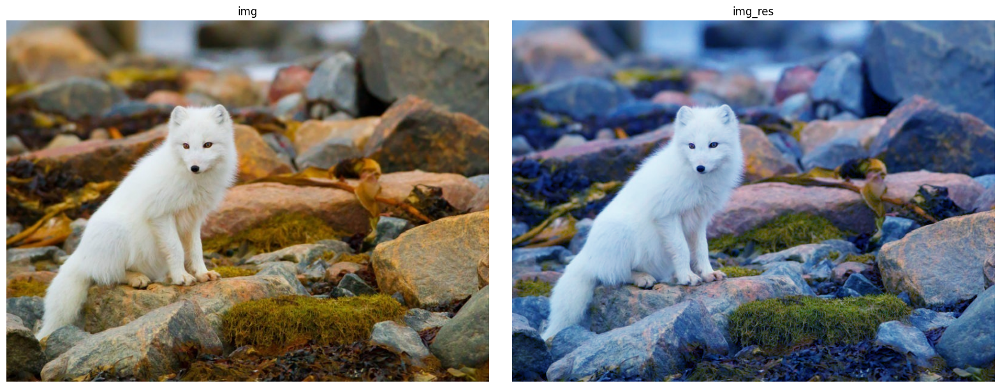

In [333]:
alg(img_color_rgb)

---

# **Тема №4. Работа с гистограммами в OpenCV**

## **Задание 7:**  
Напишите процедуру для улучшения контрастности изображения:

- Считывает изображение в оттенках серого.
- Строит его гистограмму с использованием `cv.calcHist()`.
- Применяет эквализацию гистограммы методом `cv2.equalizeHist()`.
- Отображает на одном графике исходное и эквализованное изображения вместе с их гистограммами.

In [420]:
def procedure_equaLize(img_rgb):
  img_gray = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)

  img_eq = cv.equalizeHist(img_gray)

  hist_gray = cv.calcHist(
    [img_gray],  # [img] - список изображений, для которых нужно вычислить гистограмму. здесь только одно изображение.
    [0],    # [0] - индекс канала цвета (для серого изображения = 0, для B, G, R каналов цветных изображений будет 0, 1, 2 соответственно).
    None,   # Маска для выбора подмножества пикселей для расчета гистограммы. None значит, что маска не используется, и учитываются все пиксели.
    [256],  # [256] - количество "корзин" гистограммы, то есть размер выходной гистограммы. Значение 256 для 8-битных изображений.
    [0, 256]  # Диапазон значений пикселей для расчета гистограммы. Для стандартных 8-битных изображений диапазон - от 0 до 256.
)

  hist_eqviliz = cv.calcHist(
    [img_eq],  # [img] - список изображений, для которых нужно вычислить гистограмму. здесь только одно изображение.
    [0],    # [0] - индекс канала цвета (для серого изображения = 0, для B, G, R каналов цветных изображений будет 0, 1, 2 соответственно).
    None,   # Маска для выбора подмножества пикселей для расчета гистограммы. None значит, что маска не используется, и учитываются все пиксели.
    [256],  # [256] - количество "корзин" гистограммы, то есть размер выходной гистограммы. Значение 256 для 8-битных изображений.
    [0, 256]  # Диапазон значений пикселей для расчета гистограммы. Для стандартных 8-битных изображений диапазон - от 0 до 256.
)

  img_gray = cv.cvtColor(img_gray, cv.COLOR_GRAY2RGB)
  img_eq = cv.cvtColor(img_eq, cv.COLOR_GRAY2RGB)

  plt.figure(figsize=(16,6))

  plt.subplot(2, 2, 1)
  plt.imshow(img_gray)
  plt.title('img_gray')
  plt.axis('off')

  plt.subplot(2, 2, 2)
  plt.plot(hist_gray)
  plt.title('hist_gray')
  plt.xlim([0, 256])

  plt.subplot(2, 2, 3)
  plt.imshow(img_eq)
  plt.title('img_eq')
  plt.axis('off')

  plt.subplot(2, 2, 4)
  plt.plot(hist_eqviliz)
  plt.title('hist_eqviliz')
  plt.xlim([0, 256])

  plt.show()


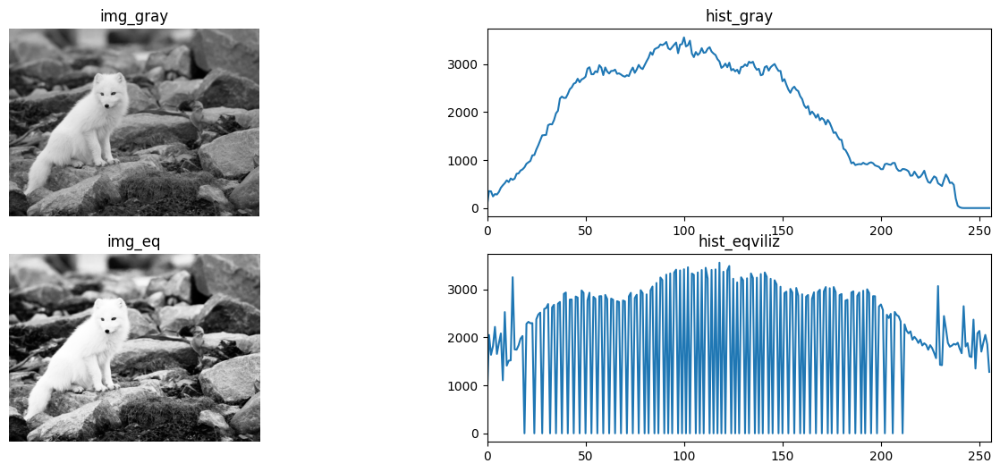

In [421]:
procedure_equaLize(img_color_rgb)

## **Задание 8:**  
Используйте метод CLAHE для улучшения деталей в затемненных областях цветного изображения:

- Преобразуйте изображение из BGR в LAB цветовое пространство.
- Разделите изображение на каналы и примените `cv2.createCLAHE()` к каналу яркости L.
- Объедините обработанный канал L с исходными каналами A и B.
- Преобразуйте изображение обратно в BGR.
- Отобразите исходное и обработанное изображения для сравнения вместе с их гистограммами.

In [458]:
def procedure_CLAHE(img_rgb, clip_limit=2.0, tile_grid_size=(8,8)):
  img_lab = cv.cvtColor(img_rgb, cv.COLOR_RGB2LAB)
  l, a, b = cv.split(img_lab)

  clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
  l_eq = clahe.apply(l)

  img_lab = cv.merge([l_eq, a, b])
  img_res = cv.cvtColor(img_lab, cv.COLOR_LAB2RGB)

  original_hist = cv.calcHist([cv.cvtColor(img_rgb, cv.COLOR_BGR2GRAY)], [0], None, [256], [0, 256])
  enhanced_hist = cv.calcHist([cv.cvtColor(img_res, cv.COLOR_BGR2GRAY)], [0], None, [256], [0, 256])

  plt.figure(figsize=(16,6))

  # plt.subplot(2, 2, 1)
  # plt.imshow(img_rgb)
  # plt.title('ORIGINAL')
  # plt.axis('off')

  # plt.subplot(2, 2, 2)
  # plt.plot(original_hist)
  # plt.title('ORIGINAL_HIST')
  # plt.xlim([0, 256])

  plt.subplot(2, 2, 3)
  plt.imshow(img_res)
  plt.title(f'CLAHE clip: {clip_limit} title: {tile_grid_size}')
  plt.axis('off')

  plt.subplot(2, 2, 4)
  plt.plot(enhanced_hist)
  plt.title('CLAHE_HIST')
  plt.xlim([0, 256])

  plt.tight_layout()
  plt.show()

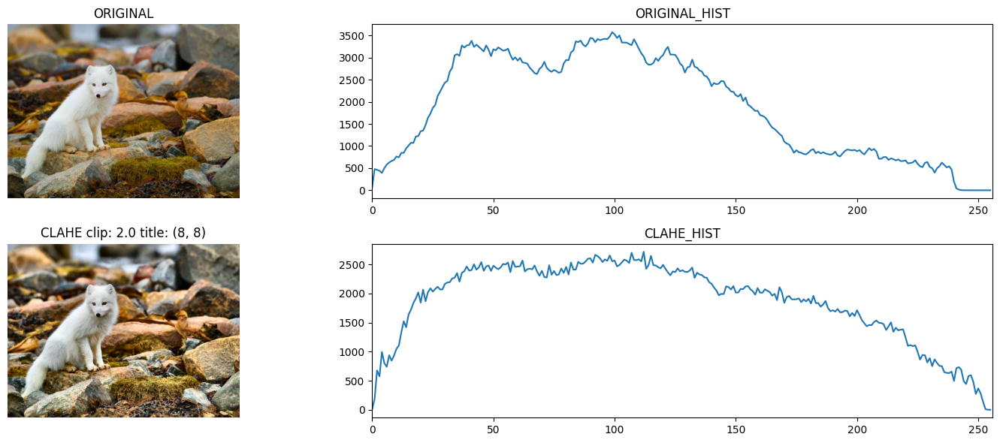

In [454]:
procedure_CLAHE(img_color_rgb)

## **Затем:**  
Исследуйте влияние размера окна (tileGridSize) и порога по сравнению с гистограммой (clipLimit) в методе CLAHE на конечный результат. Попробуйте несколько различных значений и визуализируйте результаты.


In [473]:
import requests
url = r'https://raw.githubusercontent.com/YuAo/Accelerated-CLAHE/refs/heads/master/Assets/Example-3-Before.jpg'
# Выполнение HTTP GET запроса к URL, получение ответа как потока байтов
# Тем самым мы избегаем загрузки всего содержимого в память сразу
# Использование атрибута 'raw' позволяет получить необработанный поток данных
resp = requests.get(url, stream=True).raw


# Преобразуем данные, прочитанные из потока resp.read() (набор байтов),
# в одномерный массив NumPy с типом элементов 'uint8' (unsigned integer 8 bits).
img = np.asarray(bytearray(resp.read()), dtype="uint8")


# Декодируем массив байтов в изображение с помощью функции imdecode.
# IMREAD_COLOR говорит о том, что изображение будет преобразовано в цветное с каналами BGR.
image = cv.imdecode(img, cv.IMREAD_COLOR)
img_color_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

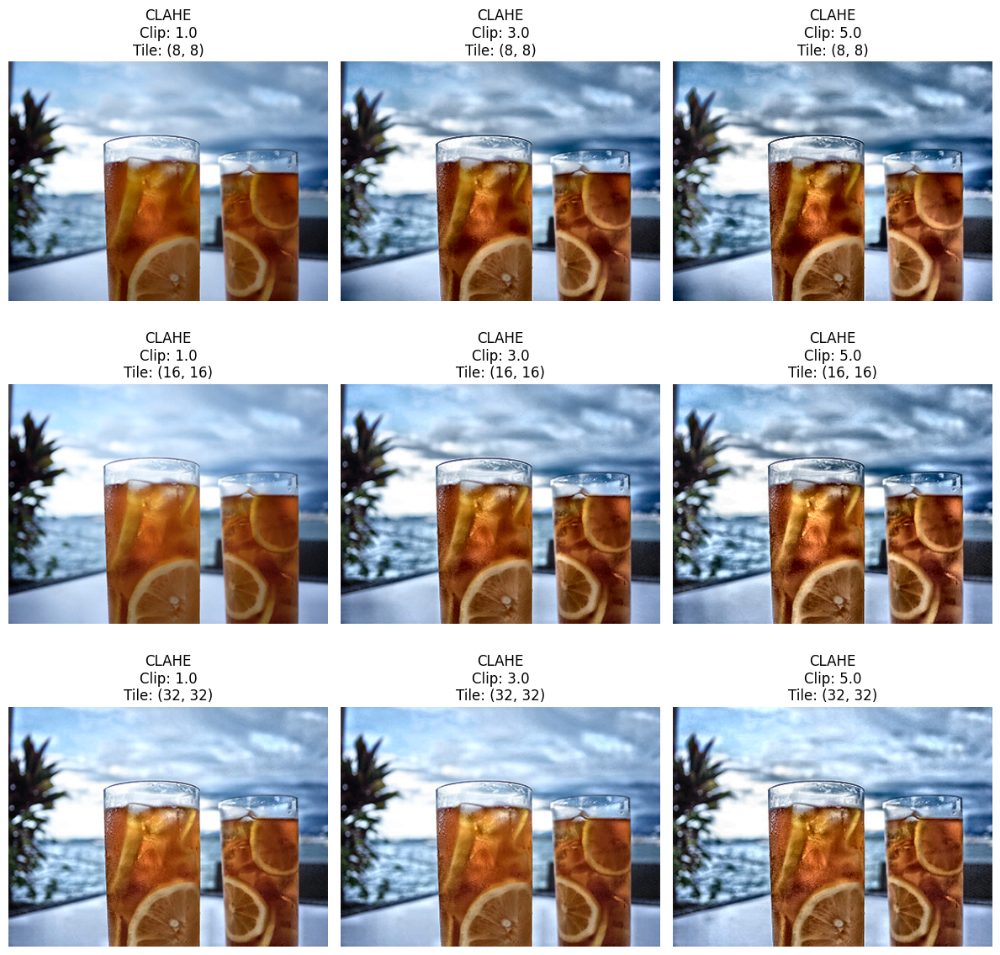

In [480]:
def procedure_CLAHE(img_rgb, clip_limit=2.0, tile_grid_size=(8, 8)):
    img_lab = cv.cvtColor(img_rgb, cv.COLOR_RGB2LAB)
    l, a, b = cv.split(img_lab)

    clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_eq = clahe.apply(l)

    img_lab = cv.merge([l_eq, a, b])
    img_res = cv.cvtColor(img_lab, cv.COLOR_LAB2RGB)

    return img_res

tile_sizes = [(8, 8), (16, 16), (32, 32)]
clip_limits = [1.0, 3.0, 5.0]

plt.figure(figsize=(12, 12))

for i, tile_size in enumerate(tile_sizes):
    for j, clip_limit in enumerate(clip_limits):
        img_res = procedure_CLAHE(img_color_rgb, clip_limit, tile_size)

        plt.subplot(3, 3, i * 3 + j + 1)
        plt.imshow(img_res)
        plt.title(f'CLAHE\nClip: {clip_limit}\nTile: {tile_size}')
        plt.axis('off')

plt.tight_layout()
plt.show()

---

# **Комплексное задание №1. Улучшение качества отсканированного документа с использованием OpenCV**



## **Краткое описание задания:**

- Необходимо написать функцию для улучшения качества отсканированного документа с использованием методов обработки изображений, изученных ранее. Функция должна принимать на вход изображение отсканированного документа и возвращать его улучшенную версию, готовую для дальнейшего использования, например, для распознавания текста.

Датасет с отсканированными изображениями можно найти в сети Интернет.

---



## **Алгоритм действий:**

#### **Реализуйте функцию на языке Python с использованием библиотеки OpenCV, которая выполняет следующие этапы обработки:**

### **1. Чтение, запись и отображение изображений:**

- Функция должна принимать на вход изображение отсканированного документа (например, в формате JPEG или PNG)
- Проверьте наличие альфа-канала в изображении и, если он присутствует, загрузите изображение в режиме `cv2.IMREAD_UNCHANGED`, иначе используйте `cv2.IMREAD_COLOR`
- Отобразите исходное изображение для визуальной проверки

### **2. Работа с цветовыми палитрами:**

- Преобразуйте изображение в оттенки серого, используя `cv2.cvtColor()` с параметром `cv2.COLOR_BGR2GRAY`.
- Отобразите полученное изображение в оттенках серого.

### **3. Слияние и усиление:**

- Примените медианный фильтр (`cv2.medianBlur()`) для удаления шумов с изображения. Выберите подходящий размер ядра (например, 3 или 5). Отобразите результат.
- Используйте фильтр сглаживания с применением прямой свертки (`cv2.filter2D()`) с заданным ядром для повышения четкости. Например, можно использовать фильтр "Unsharp Masking":
  - Создайте ядро для повышения резкости. Пример ядра:
    ```python
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    ```
  - Примените фильтр к изображению и отобразите результат.

### **4. Работа с гистограммами:**

- Примените метод CLAHE (Contrast Limited Adaptive Histogram Equalization) для улучшения контрастности изображения:
  - Создайте объект CLAHE с параметрами `clipLimit=2.0` и `tileGridSize=(8,8)`.
  - Примените CLAHE к изображению.
  - отобразите результат.
- Постройте гистограммы яркости исходного и обработанного изображений для сравнения.

---

### **Требования к функции:**

- Функция должна называться: `improve_scan(image)`, где `image` — входное изображение в виде массива NumPy.
- Функция должна возвращать улучшенное изображение в виде массива NumPy.
- В ходе работы функция должна **опционально** отображать промежуточные результаты для наглядности (в условиях Colab использовать соответствующие методы вывода изображений). Для этого следует ввести отдельный параметр (например: `visible=True`) и реализовать с ним соответствующую логику.

---

### **Дополнительные требования:**

- **Обработка ошибок:**
  - Убедитесь, что функция корректно обрабатывает ситуации, когда на вход подается некорректное изображение.
  - Добавьте проверки на тип входных данных.

- **Документация и комментарии:**
  - Функция должна быть снабжена понятной документацией: опишите, какие преобраования выполняются и для чего.
  - Добавьте комментарии к основным участкам кода для пояснения выполняемых действий.



---

### **Подсказки и рекомендации:**


- **Медианный фильтр:**
  Функция `cv2.medianBlur(src, ksize)` принимает на вход изображение и размер ядра (должен быть нечетным числом).

- **CLAHE:**
  - Создайте объект CLAHE с помощью `cv2.createCLAHE(clipLimit, tileGridSize)`.
  - Примените метод `apply()` к изображению в оттенках серого.

- **Отображение изображений в Google Colab:**
  - Используйте `matplotlib.pyplot` для отображения изображений.
  - Помните, что `cv2.imread()` загружает изображения в формате BGR, поэтому для корректного отображения в Matplotlib Преобразуйте изображение в RGB с помощью `cv2.cvtColor(image, cv2.COLOR_BGR2RGB)`.

---

In [596]:
def improve_scan(img_path, median_core=3, kernel=np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]),
                 clipLimit=2.0, tileGridSize=(8, 8), debug=True):
    """
    Улучшает изображение отсканированного документа, выполняя следующие этапы:
    1. Чтение и отображение изображения с учетом альфа-канала.
    2. Преобразование в оттенки серого.
    3. Применение медианного фильтра и фильтра резкости.
    4. Применение CLAHE для улучшения контрастности и построение гистограмм.

    Args:
        img_path (str): Путь к изображению.
        median_core (int): Размер ядра для медианного фильтра.
        kernel (np.array): Ядро для фильтра резкости.
        clipLimit (float): Ограничение контраста для CLAHE.
        tileGridSize (tuple): Размер плитки для CLAHE.
        debug (bool): Флаг отображения промежуточных результатов.

    Returns:
        np.array: Улучшенное изображение после применения CLAHE.
    """
    # Загрузка изображения
    img = cv.imread(img_path)
    if img is None:
        raise ValueError(f"Не удалось загрузить изображение: {img_path}")

    # Проверка и определение режима загрузки (хотя перезагрузка не требуется после первой загрузки)
    has_alpha = len(img.shape) == 3 and img.shape[2] == 4
    if debug and has_alpha:
        print(f"[DEBUG]: Изображение загружено с альфа-каналом (4 канала).")
    elif debug:
        print(f"[DEBUG]: Изображение загружено без альфа-канала (3 канала).")

    # Преобразование в серое изображение
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Медианный фильтр
    img_median_blur = cv.medianBlur(img_gray, median_core)

    # Фильтр резкости
    img_sharp = cv.filter2D(img_median_blur, -1, kernel)

    # Применение CLAHE
    clahe = cv.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
    img_clahe = clahe.apply(img_sharp)

    # Вычисление гистограмм
    hist_original = cv.calcHist([img_gray], [0], None, [256], [0, 256])
    hist_clahe = cv.calcHist([img_clahe], [0], None, [256], [0, 256])

    # Отображение промежуточных результатов
    if debug:
        plt.figure(figsize=(16, 12))
        plt.subplot(2, 3, 1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB) if len(img.shape) == 3 else img, cmap='gray' if len(img.shape) == 2 else None)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(2, 3, 2)
        plt.imshow(img_gray, cmap='gray')
        plt.title('Grayscale Image')
        plt.axis('off')

        plt.subplot(2, 3, 3)
        plt.imshow(img_median_blur, cmap='gray')
        plt.title(f'Median Blur (Kernel {median_core}x{median_core})')
        plt.axis('off')

        plt.subplot(2, 3, 4)
        plt.imshow(img_sharp, cmap='gray')
        plt.title('Sharpened Image')
        plt.axis('off')

        plt.subplot(2, 3, 5)
        plt.imshow(img_clahe, cmap='gray')
        plt.title(f'CLAHE (Clip: {clipLimit}, Tile: {tileGridSize})')
        plt.axis('off')

        plt.subplot(2, 3, 6)
        plt.plot(hist_clahe, label='CLAHE Histogram')
        plt.plot(hist_original, label='Original Histogram')
        plt.title('Histograms Comparison')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.xlim([0, 256])
        plt.legend()

        plt.tight_layout()
        plt.show()

    return img_clahe

In [597]:
url = 'https://funik.ru/wp-content/uploads/2022/11/84264b419b12c85f2043.jpg'
!wget -O scanData.jpg '{url}'
image_path = 'scanData.jpg'

--2025-09-14 17:13:24--  https://funik.ru/wp-content/uploads/2022/11/84264b419b12c85f2043.jpg
Resolving funik.ru (funik.ru)... 176.118.166.238
Connecting to funik.ru (funik.ru)|176.118.166.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 76815 (75K) [image/jpeg]
Saving to: ‘scanData.jpg’

scanData.jpg        100%[===================>]  75.01K   293KB/s    in 0.3s    

2025-09-14 17:13:25 (293 KB/s) - ‘scanData.jpg’ saved [76815/76815]



[DEBUG]: Изображение загружено без альфа-канала (3 канала).


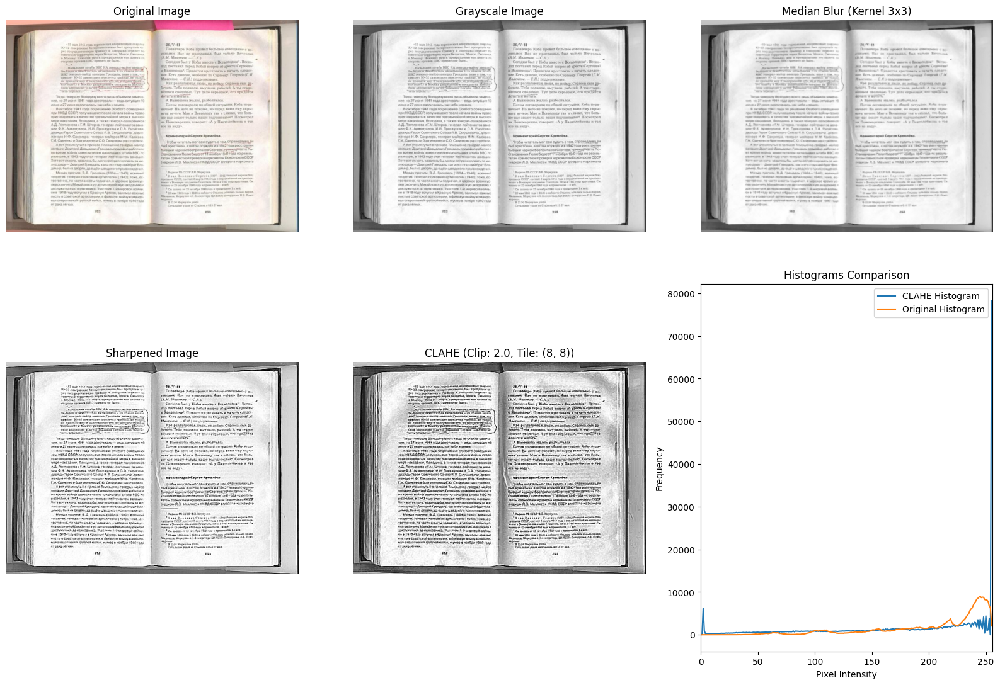

array([[193, 193, 193, ...,  61,  50,  50],
       [193, 193, 193, ...,  53,  47,  40],
       [187, 187, 187, ...,  43,  43,  41],
       ...,
       [152, 152, 152, ...,  72,   6,   2],
       [145, 145, 145, ...,  70,   4,   4],
       [165, 165, 165, ...,  66,   2,   2]], dtype=uint8)
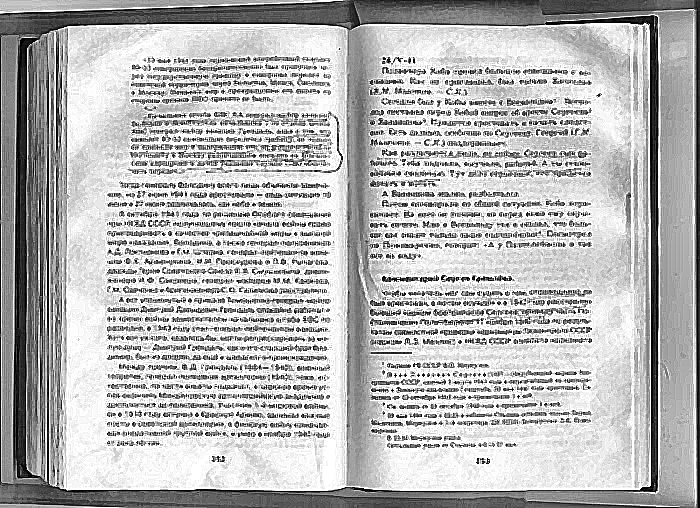

In [598]:
improve_scan(image_path, debug = True)

## **Дополнительное задание:**

- Поэкспериментируйте с параметрами медианного фильтра, ядром для фильтра повышения резкости и параметрами CLAHE для достижения наилучшего результата.
- Добавьте возможность передачи этих параметров в функцию `improve_scan` для более гибкой настройки обработки. **В качестве параметров по умолчанию установите те, которые показали себя лучше всего по результатам экспериментов**

**Пример с параметрами:**

```python
def improve_scan(image,
                 median_kernel_size=3,
                 sharp_kernel= np.array([[-1, -1, -1],
                                         [-1,  9, -1],
                                         [-1, -1, -1]]),
                 clahe_clip=2.0,
                 clahe_grid=(8,8),
                 visible=True):
    # Реализация с учетом переданных параметров
    ...
```


In [611]:
tile_sizes = [(8, 8), (16, 16), (32, 32)]
clip_limits = [1.0, 3.0, 5.0]

plt.figure(figsize=(22, 22))

for i, tile_size in enumerate(tile_sizes):
    for j, clip_limit in enumerate(clip_limits):
        img_res = improve_scan(image_path, clipLimit=clip_limit, tileGridSize=tile_size, debug = False)

        plt.subplot(3, 3, i * 3 + j + 1)
        plt.imshow(cv.cvtColor(img_res, cv.COLOR_BGR2RGB))
        plt.title(f'CLAHE\nClip: {clip_limit}\nTile: {tile_size}')
        plt.axis('off')

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

array([[198, 198, 198, ...,  52,  43,  48],
       [198, 198, 198, ...,  46,  44,  48],
       [198, 198, 198, ...,  43,  47,  49],
       ...,
       [144, 144, 144, ...,  71,   2,   8],
       [138, 138, 138, ...,  68,   2,  10],
       [160, 160, 160, ...,  69,   2,   5]], dtype=uint8)
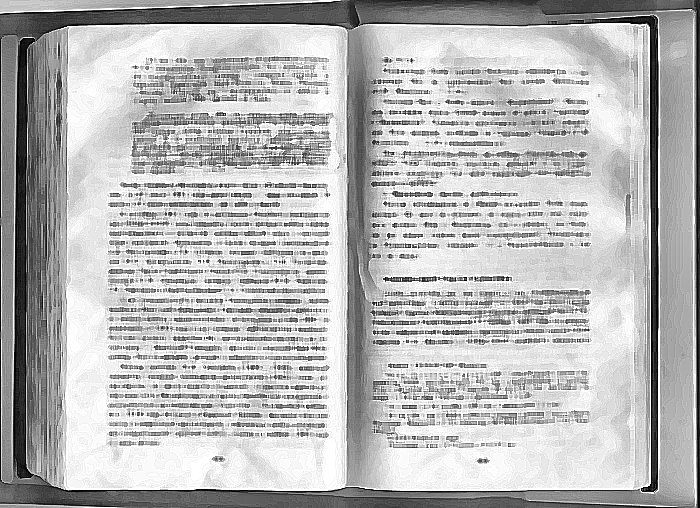

In [601]:
improve_scan(image_path, median_core=7, debug=False)

array([[195, 195, 195, ...,  51,  47,  48],
       [195, 195, 195, ...,  49,  47,  42],
       [193, 193, 193, ...,  45,  45,  43],
       ...,
       [149, 149, 149, ...,  74,  33,  23],
       [147, 147, 147, ...,  72,  31,  26],
       [155, 155, 155, ...,  71,  28,  23]], dtype=uint8)
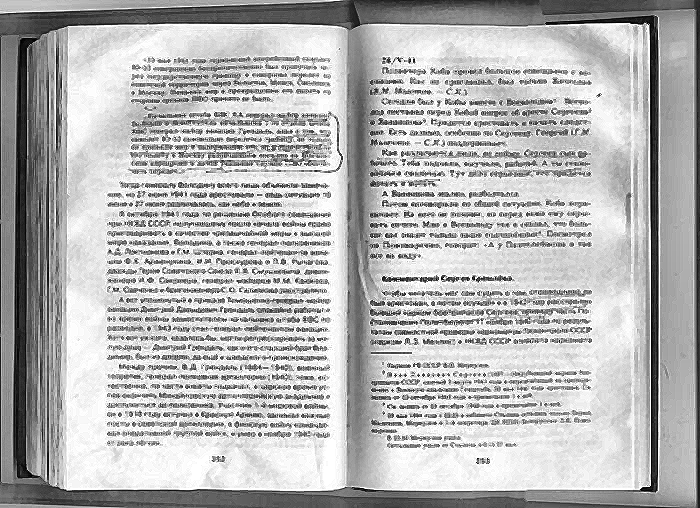

In [604]:
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
improve_scan(image_path, kernel=kernel, debug=False)

array([[212, 212, 212, ...,  57,  43,  43],
       [212, 212, 212, ...,  47,  40,  33],
       [200, 200, 200, ...,  36,  35,  34],
       ...,
       [205, 205, 205, ...,  68,  10,   4],
       [197, 197, 197, ...,  66,   6,   7],
       [220, 220, 220, ...,  62,   4,   4]], dtype=uint8)
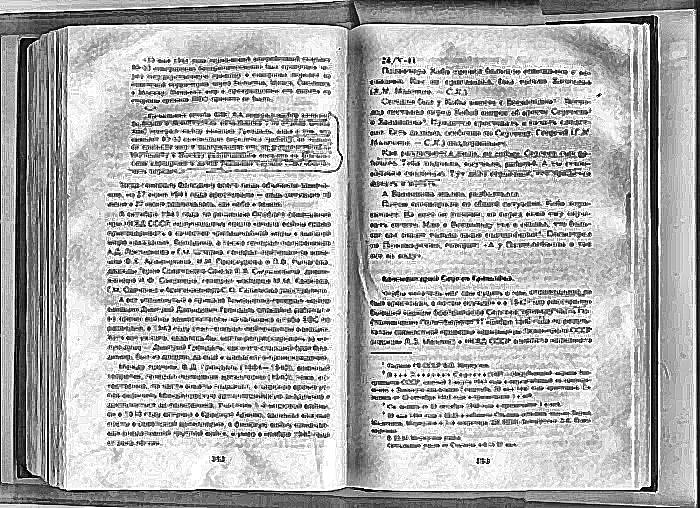

In [607]:
improve_scan(image_path, clipLimit=4.0, tileGridSize=(16, 16), debug=False)